<a href="https://colab.research.google.com/github/srpineda/ml-project-dog-breed-identification/blob/main/dog_breed_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given the image of a dog.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition. 

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
Multi Class Log Loss between the predicted probability and the observed target. For each image in the test set, we must predict a probability for each of the different breeds.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Some information with the data:
- We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning. 
- There are 120 breeds of dogs (so there are 120 different classes).
- There are around 10,000+ images in the training set (with labels)
- There are around 10,000+ images in the test set (no labels)

In [ ]:
# How to unzip a folder in Google Drive
# !unzip [filepath - where it is stored] -d [filepath where you want to store it]

### Get our workspace ready
- Import TensorFlow ✅
- Import TensorFlow Hub ✅
- Make sure we're using a GPU ✅

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check for GPU availability
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')



TF version: 2.3.0
TF Hub version: 0.10.0
GPU available


## Getting our data ready (turning it into tensors)

With all machine learning models, our data has to be in numerical format. 

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Data Science Projects/dog-breed-identification/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     502aea218351d108244049aa16cfafe6  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


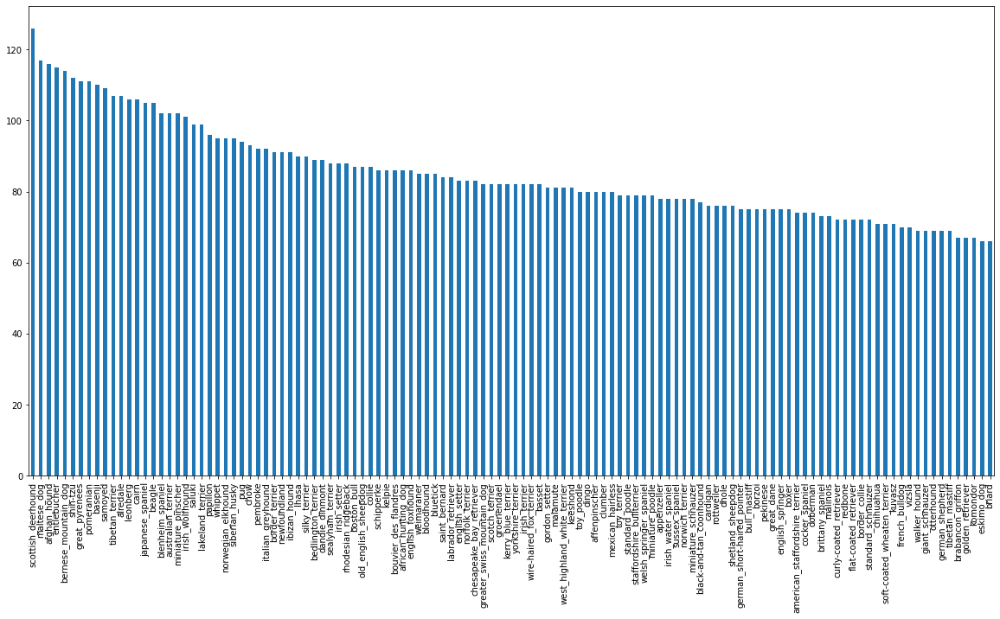

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

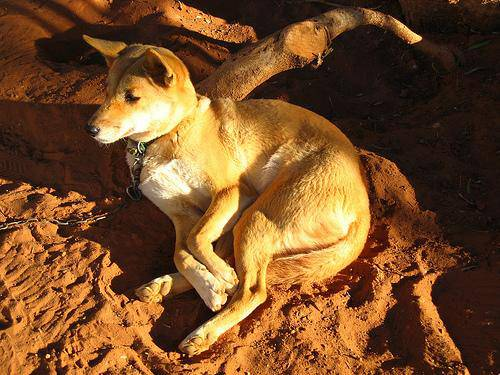

In [ ]:
# Let's view an image
from IPython.display import Image
Image('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their labels
Let's get a list of all of our image file path names

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ['/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identif

In [ ]:
# Check if number of filenames matches number of actual image files
len(filenames)

10222

In [ ]:
import os
len(os.listdir('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/'))

10222

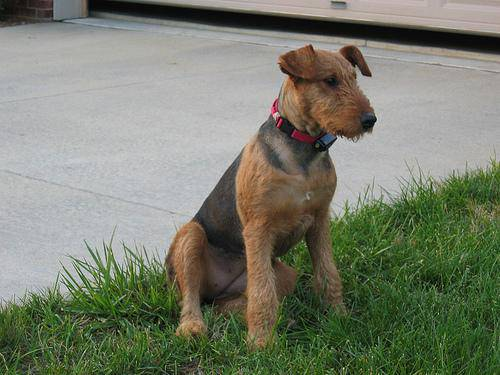

In [ ]:
Image(filenames[7200])

In [ ]:
labels_csv['breed'][7200]

'airedale'

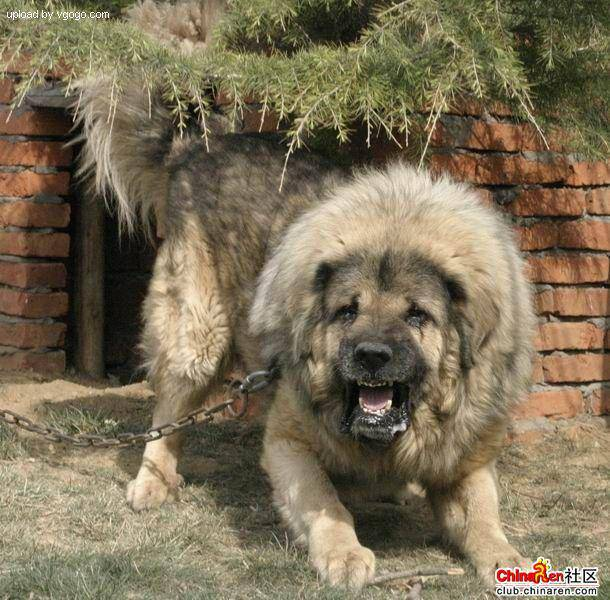

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

### Prepare the labels

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Check if number of labels is equal to the number of filenames
len(labels)

10222

In [ ]:
len(filenames)

10222

In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
 # Turn a single label into an array of booleans
 print(labels[0])
 labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set 

(Since the data doesn't provide us one)

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param{type:'slider', min:1000, max:10000, step: 1000}

In [ ]:
# Split data into train and validation
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5]

['/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg']

In [ ]:
y_train[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

## Preprocessing images (turning images into Tensors)

To preprocess our images, we're gonna write a function which does the following:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (.jpg) into Tensors
4. Normalize our image (convert color channels values from [0,255] to [0,1]
5. Resize the image to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

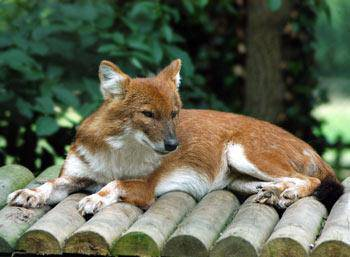

In [ ]:
Image(filenames[42])

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Preprocess images

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Tensor.
  '''
  # Read an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from [0,255] to [0,1) values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning our data into batches

Why turn data into batches?

Let's say you're trying to process 10k+ images in one go... they all might not fit into memory

That's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be.)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above function
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Next, make a function to turn all of our data `(X & y)` into batches

In [ ]:
# Define the batch size (32 is default, but we're gonna define it anyway)
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a validation dataset, we don't need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')

    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
                                               
  else:
    print('Creating training data batches...')

    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling later
    data = data.shuffle(buffer_size=len(X))

  # Create image (image, label) label tuples (this also turns the image path into a preprocessed image)
  data = data.map(get_image_label)

  # Turn the training data into batches
  data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches 

Data is now in batches. However, these can be a little hard to understand/comprehend. let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 cols)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')
    

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

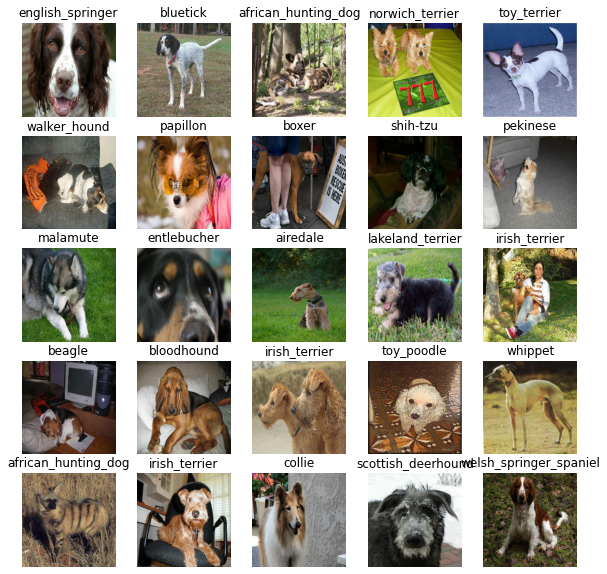

In [ ]:
# Now, let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

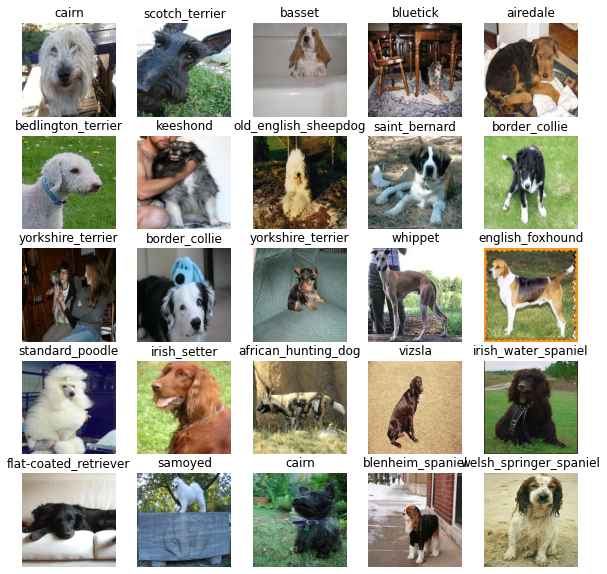

In [ ]:
 # Now, let's visualize the data in a training batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
- The input shape (our image shape, in the form of Tensors) to our model
- The output shape (image labels, in the form of Tensors) of our model
- The URL of the model we want to use from TensorFlow Hub https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

### Load a pretrained model

In [ ]:
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [ ]:
# Load trained model
model = load_model('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201209-200950-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201209-200950-1000-images-mobilenetv2-Adam.h5


In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
- Takes the input shape, output shape, and the model we've chosen as parameters.
- Defines the layers in a Keras model in a sequential fashion (do this first then that)
- Compiles the model (says it should be evaluated and improved)
- Builds the model (tells the model the input shape it'll be getting)
- Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
print(INPUT_SHAPE)
print(OUTPUT_SHAPE)
print(MODEL_URL)

[None, 224, 224, 3]
120
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with: ', model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(model_url), # Layer 1 (input layer)
                               tf.keras.layers.Dense(units=output_shape,
                                                     activation='softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # Build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions that a model can use during training to save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks:
- for tracking its progress; and 
- for early stopping 

### Tensorboard Callback
To setup TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%reload_ext tensorboard

### Model progress tracker callback

In [ ]:
import datetime # to track experiments

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/logs',
        # Track progress whenever we run an experiment
        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
- helps our model from overfitting

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on a subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min: 10, max:100, step: 10}

In [ ]:
# Check if we're using a GPU
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available


### Create a function that trains a model
- Create a model using `create_model()`
- Setup a TensorBoard callback using `create_tensorboard_callback()`
- Call the `fit()` function on our model passing it the training, validation data, number of epochs to train for and the callbacks we'd like to use
- Return the model

In [ ]:
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''
  # Create a model 
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1, # test data once an epoch
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/10
 1/25 [>.............................] - ETA: 0s - loss: 6.1995 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 809s 32s/step - loss: 4.6138 - accuracy: 0.0988 - val_loss: 3.5284 - val_accuracy: 0.2250
Epoch 2/10
25/25 [==============================] - 4s 165ms/step - loss: 1.6244 - accuracy: 0.6925 - val_loss: 2.2732 - val_accuracy: 0.4750
Epoch 3/10
25/25 [==============================] - 4s 164ms/step - loss: 0.5591 - accuracy: 0.9438 - val_loss: 1.7383 - val_accuracy: 0.5550
Epoch 4/10
25/25 [==============================] - 4s 162ms/step - loss: 0.2461 - accuracy: 0.9887 - val_loss: 1.5188 - val_accuracy: 0.6250
Epoch 5/10
25/25 [==============================] - 4s 160ms/step - loss: 0.1446 - accuracy: 0.9950 - val_loss: 1.4341 - val_accuracy: 0.6150
Epoch 6/10
25/25 [==============================] - 4s 170ms/step - loss: 0.0981 - accuracy: 1.0000 - val_loss: 1.3874 - val_accuracy: 0.6250
Epoch 7/10
25/25 [==============================] - 4s 165ms/step - loss: 0.0748 - accuracy: 1.0000 - val_loss: 1.3609 - val_accuracy: 0.6350
Epoch 8/10
25/25 

## Checking the TensorBoard Logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/logs'

<IPython.core.display.Javascript object>

##  Making and evaluating predictions using a trained model

In [ ]:
predictions = model.predict(val_data, verbose=1)

7/7 [==============================] - 97s 14s/step


In [ ]:
predictions

array([[3.16623482e-03, 6.17541373e-05, 5.56031591e-04, ...,
        2.27611439e-04, 1.89108141e-05, 6.83803530e-03],
       [3.62960389e-03, 4.10794659e-04, 8.93139280e-03, ...,
        1.09883980e-03, 1.05826231e-03, 2.55053106e-04],
       [1.83139491e-05, 3.72176037e-05, 2.17940105e-05, ...,
        1.61454052e-04, 2.83053178e-05, 3.02240460e-05],
       ...,
       [6.87757129e-05, 6.73008035e-04, 1.50372609e-04, ...,
        2.18972746e-05, 3.37567937e-04, 4.38876246e-04],
       [7.39682652e-03, 1.64186058e-04, 3.68826382e-04, ...,
        4.10607259e-04, 1.59792020e-04, 2.00759880e-02],
       [1.87327605e-04, 1.48783565e-05, 4.77963826e-03, ...,
        1.88620924e-03, 2.12320290e-03, 8.72495639e-06]], dtype=float32)

In [ ]:
index = 0
print(predictions[0])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])} ')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[3.16623482e-03 6.17541373e-05 5.56031591e-04 1.06282438e-04
 1.32609508e-04 5.29138779e-05 8.04763380e-03 5.90476557e-05
 2.11251187e-04 1.97471454e-04 4.27121005e-04 9.18584556e-05
 2.20510236e-04 1.15634837e-04 2.49886682e-04 6.06072193e-04
 1.36523624e-04 1.40481144e-01 1.62998942e-04 2.94351281e-04
 5.30355086e-04 1.89015933e-04 1.92348489e-05 1.04193365e-04
 7.68040627e-05 5.20794187e-04 2.43861690e-01 3.77156102e-05
 7.12900364e-05 7.19834235e-04 5.24526513e-05 4.44291712e-04
 1.00905687e-04 4.35097863e-05 3.08074304e-05 3.20692249e-02
 6.23743035e-05 1.15303374e-04 3.14053177e-05 1.73483859e-04
 1.71263574e-03 9.33134288e-06 1.63827266e-04 1.70848813e-04
 2.27288674e-05 1.56582664e-05 3.54834883e-05 3.08284158e-04
 1.12929229e-04 9.18960432e-05 1.36351620e-04 3.02421140e-05
 6.93706155e-04 2.87669915e-04 1.07755768e-04 8.13376973e-05
 9.01999083e-05 1.69965648e-03 4.58119495e-04 1.36204690e-01
 9.14157354e-05 7.14484850e-05 1.65226066e-03 1.25497972e-05
 5.96625556e-04 4.402235

In [ ]:
np.argmax(y_val[0]), unique_breeds[26]

(26, 'cairn')

In [ ]:
index = 1
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])} ')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[3.6296039e-03 4.1079466e-04 8.9313928e-03 3.9403108e-03 2.8305664e-04
 1.7377741e-04 4.2078029e-03 5.3072505e-04 8.7158562e-04 1.4992585e-04
 1.4221875e-04 2.0887694e-05 6.5481443e-05 9.9010009e-05 3.7766082e-04
 2.7192087e-04 3.6359215e-04 2.3269819e-03 7.5467367e-05 4.8341256e-04
 3.4094517e-04 5.9466285e-05 3.8780679e-05 2.0123029e-05 2.6998996e-05
 8.5180385e-05 4.5467507e-02 7.7664654e-04 8.6477237e-05 4.3052083e-04
 6.4708693e-05 2.9325080e-05 3.3181568e-04 2.0849859e-05 1.3074793e-03
 5.0438796e-03 6.7161956e-05 8.0613414e-04 2.4962358e-04 9.5134579e-05
 1.1931718e-04 2.5508777e-04 4.7919794e-04 4.2934957e-04 1.2551958e-03
 1.0494777e-03 1.5137909e-04 1.7997727e-04 2.5035050e-02 5.9123096e-05
 6.1521668e-04 8.9475431e-04 3.0235478e-05 4.0615490e-05 6.0888368e-04
 1.5974332e-03 2.6835257e-04 1.3445362e-02 6.2640110e-04 3.2762045e-03
 2.5069082e-04 6.4203623e-06 4.8703743e-05 7.9970509e-05 3.4139794e-03
 7.4048425e-05 3.1998413e-04 8.3829640e-05 2.1095308e-03 1.9564097e-05
 2.715

In [ ]:
np.argmax(y_val[1]), unique_breeds[96]

(96, 'scotch_terrier')

### Visualizing Predictions

In [ ]:
def get_label(probabilities):
  '''
  Turns an array of probabilities into a label.
  '''
  return unique_breeds[np.argmax(probabilities)]

In [ ]:
pred_label = get_label(predictions[81])
pred_label

'dingo'

We need to unbatch the validation data set to access the validation images and labels and compare those to our predictions.

In [ ]:
# Create a function to unbatch a dataset
def unbatchify(data):
  '''
  Takes a data batch of (image, label) Tensors and returns two separate arrays of images and labels.
  '''
  images = list()
  labels = list()
  # Loops through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)
  return images, labels

In [ ]:
# Unbatch validation data set batch
unbatched_val_images, unbatched_val_labels = unbatchify(val_data)
unbatched_val_images[0], unbatched_val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_label(unbatched_val_labels[0])

NameError: ignored

#### Make a function to visualize the predictions
- takes an array of pred probas, an array of truth labels and an array of images and an integer
- convert the pred probas to a predicted label
- plot the predicted label, its predicted probas, the truth label and the target image on a single plot 

In [ ]:
def plot_pred(prediction_probas, labels, images, n=1):
  '''
  View the prediction, ground truth, and image for sample n
  '''
  pred_prob, true_label, image = prediction_probas[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_label(pred_prob)
  true_label = get_label(true_label)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title
  plt.title(f'pred: {pred_label} {np.max(pred_prob)*100:2.0f}% | truth: {true_label}', color=color)

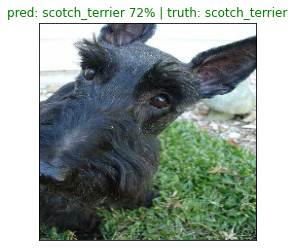

In [ ]:
plot_pred(predictions, unbatched_val_labels, unbatched_val_images)

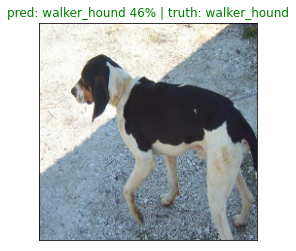

In [ ]:
plot_pred(predictions, unbatched_val_labels, unbatched_val_images, n=31)

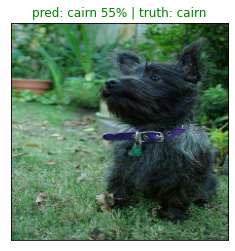

In [ ]:
plot_pred(predictions, unbatched_val_labels, unbatched_val_images, n=22)

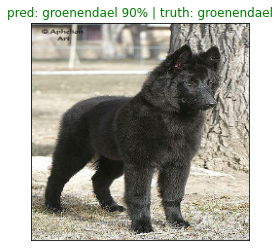

In [ ]:
plot_pred(predictions, unbatched_val_labels, unbatched_val_images, n=45)

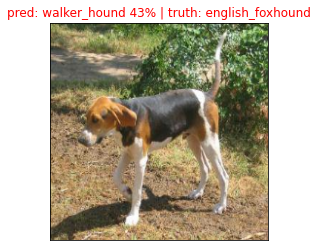

In [ ]:
plot_pred(predictions, unbatched_val_labels, unbatched_val_images, n=42)

In [ ]:
len(unbatched_val_images)

200

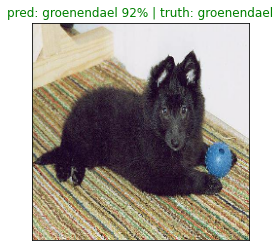

In [ ]:
plot_pred(predictions, unbatched_val_labels, unbatched_val_images, n=77)

#### Make a function that plots model's top 10 predictions

This function will:
- Take an input of prediction probabilities array and a ground truth array and an integer
- Find the prediction using `get_pred_label()`
- Find the top 10:
  - Prediction probabilities indexes
  - Prediction probabilities values
  - Prediction labels
- Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, ground_truth_labels, n=1):
  '''
  Plots the top 10 highest prediction confidences along with the truth label for the nth prediction.
  '''
  pred_proba, true_label = prediction_probabilities[n], ground_truth_labels[n]

  # Get predicted label
  pred_label = get_label(pred_proba)

  # Find the top 10 prediction confidence indices
  top_10_pred_indices = pred_proba.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_proba[top_10_pred_indices]

  # Find the top 10 prediction confidence labels
  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  # Setup plot
  top_10_plot = plt.bar(top_10_pred_labels,
                        height = top_10_pred_values,
                        color = 'grey')
  plt.xticks(rotation='vertical')
  
  # Change color of true label
  if get_label(true_label) in top_10_pred_labels:
    top_10_plot[np.argmax(top_10_pred_labels==get_label(true_label))].set_color('green');

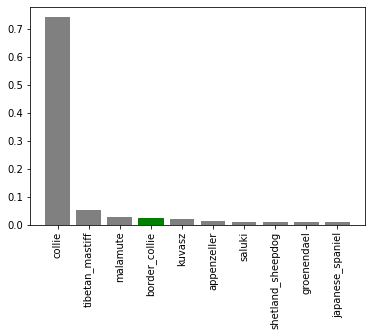

In [ ]:
plot_pred_conf(predictions, val_labels, n=9)

In [ ]:
# Let's check out some predictions and their diff values
def plot_pred_and_conf(labels = val_labels, images=val_images, start_index = 0, num_rows = 3, num_cols = 2):
  num_images = num_rows*num_cols
  plt.figure(figsize=(10*num_cols, 5*num_rows))
  for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(predictions, labels, images, n=i+start_index)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(predictions, labels, i+start_index)
  plt.tight_layout(h_pad=1)
  plt.show()

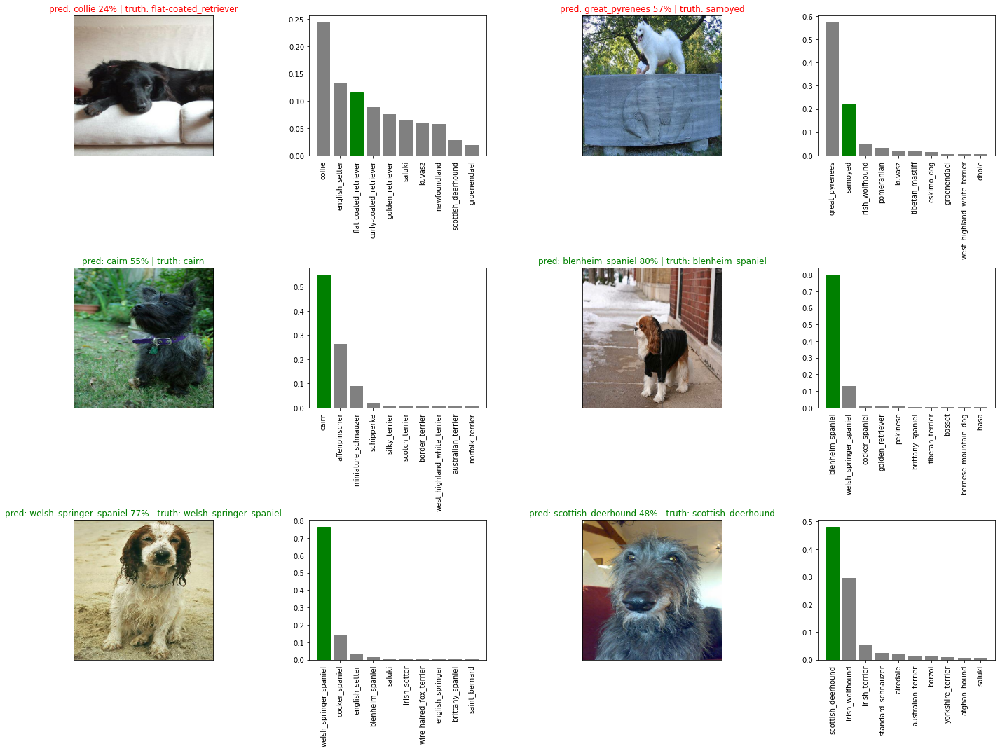

In [ ]:
plot_pred_and_conf(start_index=20)

### Plot confusion matrix

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    import itertools
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.figure(figsize=(50, 30))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

In [ ]:
# from sklearn.metrics import confusion_matrix

# cnf_matrix = confusion_matrix([get_label(data) for data in unbatched_val_labels], [get_label(pred) for pred in predictions], unique_breeds)
# np.set_printoptions(precision=2)

# # Plot non-normalized confusion matrix
# plt.figure()
# plot_confusion_matrix(cnf_matrix, classes=unique_breeds,
#                       title='Confusion matrix, without normalization')

In [ ]:
len(predictions[0])

120

In [ ]:
get_label(predictions[0])

'cairn'

In [ ]:
len(val_labels)

32

## Saving ang Loading a trained model

In [ ]:
def save_model(model, suffix=None):
  '''
  Saves a given model in a model directory and appends a suffix (string)
  '''
  # Create a model directory pathname with a current time
  modeldir = os.path.join('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path = modeldir + '-' + suffix + '.h5' # save format model
  print(f'Saving model to {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [ ]:
# Save model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to /content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201209-211723-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201209-211723-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201209-200950-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201209-200950-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Load trained model
model = load_model('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201209-200950-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201209-200950-1000-images-mobilenetv2-Adam.h5


In [ ]:
get_label(true_label) in top_10_pred_labels

True

## Training data (on the full dataset)

### Create data batch with full data set

In [ ]:
full_data = create_data_batches(X,  y)

Creating training data batches...


### Create model for full model

In [ ]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


### Create full model callbacks

In [ ]:
# For progress tracking
full_model_tensorboard = create_tensorboard_callback()

In [ ]:
# Early stopping callback for full data
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

### Fit the model to the full data 

In [ ]:
full_model.fit(x=full_data, 
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
  1/320 [..............................] - ETA: 0s - loss: 5.8400 - accuracy: 0.0312WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


320/320 [==============================] - 5641s 18s/step - loss: 1.3456 - accuracy: 0.6699
Epoch 2/100
320/320 [==============================] - 48s 151ms/step - loss: 0.4004 - accuracy: 0.8817
Epoch 3/100
320/320 [==============================] - 47s 145ms/step - loss: 0.2378 - accuracy: 0.9361
Epoch 4/100
320/320 [==============================] - 47s 146ms/step - loss: 0.1561 - accuracy: 0.9613
Epoch 5/100
320/320 [==============================] - 47s 146ms/step - loss: 0.1055 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 47s 147ms/step - loss: 0.0772 - accuracy: 0.9875
Epoch 7/100
320/320 [==============================] - 46s 143ms/step - loss: 0.0581 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0473 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 47s 146ms/step - loss: 0.0376 - accuracy: 0.9968
Epoch 10/100
320/320 [==============================] - 47s 147ms/step - los

In [ ]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to /content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201212-231055-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201212-231055-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load model
loaded_full_model = load_model('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201212-231055-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Data Science Projects/dog-breed-identification/models/20201212-231055-full-image-set-mobilenetv2-Adam.h5


## Make Predictions on Test Data

### Preprocess test data
Convert test data into the same format as where the model has been trained on, which is the test data set

1. Store the test images' filenames in an array
2. Convert it into test data batches using `create_data_batches(test_data='True)`

#### Load test images

In [ ]:
import os
test_path = '/content/drive/MyDrive/Data Science Projects/dog-breed-identification/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

#### Create test data batches

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

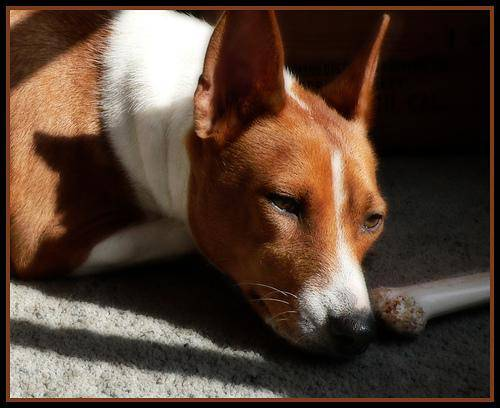

In [ ]:
Image(test_filenames[100])

### Make predictions on the test data batch

In [ ]:
# Will run for a long time because there are over 10k test images (as long as that of training)
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 4033s 12s/step


#### Save predictions
Load this immediately after predict as to not lose the predictions when runtime is cut


In [ ]:
np.savetxt('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/preds_array.csv',
           test_predictions,
           delimiter = ',')

#### Load predictions from a csv file

In [ ]:
import numpy as np

test_predictions = np.loadtxt('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/preds_array.csv', delimiter=',')
test_predictions

array([[1.06376537e-13, 3.20949132e-13, 1.11314289e-12, ...,
        6.20751020e-12, 7.34781092e-15, 2.79057155e-17],
       [4.61184035e-10, 1.21849511e-13, 2.36525044e-09, ...,
        1.29686861e-09, 7.36528026e-12, 1.45310912e-12],
       [5.76650450e-07, 5.58422907e-05, 2.66357301e-08, ...,
        1.09062910e-08, 2.14308116e-07, 1.71146567e-05],
       ...,
       [2.03626893e-09, 1.73232362e-09, 3.74569495e-08, ...,
        2.38517389e-01, 1.09003049e-04, 1.06918273e-10],
       [1.12345744e-10, 4.02168854e-11, 1.74506880e-08, ...,
        5.36863809e-06, 7.42862423e-13, 2.02562610e-14],
       [3.36593836e-10, 5.00097241e-10, 1.37115592e-07, ...,
        3.86715406e-08, 1.63941873e-08, 1.07149754e-10]])

## Preparing the dataset predictions for Kaggle

Kaggle wants the predictions to be submitted in the following format:
- First column contains the image IDs, which are the filenames of the images
- The other columns are each of the dog breeds, and the values in a particular column is the model's computed probability that the image is of that particular dog breed.
- The file is in csv format.

See the link below for the sample submission format:
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation


In [ ]:
## Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id']+list(unique_breeds))

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to preds_df
test_ids = [os.path.splitext(path)[0] for path in os.listdir('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/test')]
test_ids[:3]

['f477da1f84ba93e037a7786c0f2a91f4',
 'f453249b8fff37e92e02fce0d662ffa0',
 'f4560b7a3045615d9fcc915b5b08de1b']

In [ ]:
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f477da1f84ba93e037a7786c0f2a91f4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f453249b8fff37e92e02fce0d662ffa0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f4560b7a3045615d9fcc915b5b08de1b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f51f6aeea8a23b6bd62728fde8f04ad8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f58a21665136bb6aa4aa90c485be4315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f477da1f84ba93e037a7786c0f2a91f4,1.06377e-13,3.20949e-13,1.11314e-12,3.11939e-15,1.3318e-12,1.49501e-10,7.67123e-16,1.03045e-12,3.41936e-12,3.22223e-12,7.48365e-11,9.99652e-15,1.61514e-10,6.07836e-14,1.76205e-13,9.10417e-13,7.84858e-13,1.80238e-14,3.00196e-11,3.79615e-14,1.47966e-16,4.21733e-13,2.441e-16,2.13138e-13,2.14221e-12,6.1562e-14,9.02889e-17,3.33937e-14,2.02442e-10,3.4067e-15,4.77415e-15,5.46618e-14,8.37425e-17,6.82622e-14,1.57287e-10,3.72024e-12,1.87078e-14,2.5775e-13,1.55387e-11,...,2.05634e-14,1.03817e-16,2.77369e-11,3.19492e-16,1.69846e-14,1.28172e-13,9.57714e-15,2.48917e-16,3.15109e-10,9.86553e-12,1.19591e-10,4.35267e-12,3.38564e-13,2.32124e-11,8.99875e-09,5.14156e-17,9.61934e-14,8.3349e-12,1.17376e-12,3.66147e-15,6.06122e-13,3.92425e-12,1.44862e-13,1.20247e-13,1.30646e-15,3.85204e-10,1.93526e-13,1.14182e-15,1.18482e-11,6.89815e-17,5.2446e-15,2.88717e-13,2.6973e-17,1.7715e-10,3.24285e-09,5.52253e-14,1.45911e-11,6.20751e-12,7.34781e-15,2.79057e-17
1,f453249b8fff37e92e02fce0d662ffa0,4.61184e-10,1.2185e-13,2.36525e-09,2.30744e-11,7.19977e-11,1.57228e-12,1.04551e-10,9.92607e-08,3.42764e-12,4.14907e-11,5.51595e-11,4.46321e-11,4.42834e-09,2.32903e-12,2.1189e-10,4.23407e-12,2.46634e-10,1.92273e-07,2.09143e-12,3.52497e-12,2.08255e-09,2.99697e-08,5.09525e-10,1.50852e-11,2.16437e-11,1.55998e-08,1.07438e-06,1.26872e-09,1.02761e-10,4.69212e-09,1.69174e-08,4.64836e-11,2.08697e-13,1.86304e-10,3.95829e-13,1.55728e-10,9.20629e-08,1.36704e-06,3.88906e-11,...,0.999353,3.7995e-10,1.56147e-10,8.39895e-14,2.49246e-10,1.99216e-10,1.58677e-09,8.49361e-10,2.80781e-06,2.69326e-08,1.13383e-10,6.5803e-11,4.00688e-09,1.61756e-11,1.31101e-10,1.70075e-08,1.09201e-09,1.53562e-13,2.70157e-13,2.66326e-13,3.27109e-11,8.64685e-07,1.31309e-08,9.48835e-09,1.87112e-10,8.06953e-11,1.34753e-08,1.80339e-13,2.15041e-10,3.60424e-10,3.91897e-12,4.48834e-09,2.05837e-12,4.49946e-10,2.5717e-11,2.00225e-11,4.70879e-11,1.29687e-09,7.36528e-12,1.45311e-12
2,f4560b7a3045615d9fcc915b5b08de1b,5.7665e-07,5.58423e-05,2.66357e-08,3.14258e-10,7.73797e-09,2.16381e-10,5.87611e-07,3.34469e-08,1.0199e-09,1.49877e-08,1.30875e-09,2.96359e-08,2.59326e-08,9.68237e-07,3.63226e-09,5.38471e-08,1.0132e-07,1.20292e-08,1.65573e-09,3.88581e-07,8.85466e-08,3.17509e-07,1.00119e-07,6.72766e-05,1.41821e-08,3.28421e-06,1.02637e-09,2.04075e-11,1.73113e-09,7.76682e-09,1.29423e-08,1.74815e-05,3.35802e-06,2.93205e-08,1.57163e-11,2.22425e-07,2.88437e-10,5.44322e-10,6.30538e-11,...,1.26455e-08,1.62246e-08,1.6547e-07,4.95095e-05,2.48267e-06,0.000762899,1.84192e-10,5.03412e-07,3.67745e-08,3.5596e-09,3.54285e-08,4.0724e-07,6.66453e-08,4.15418e-06,6.30536e-09,6.70416e-09,2.01242e-12,5.0687e-10,1.2555e-05,8.71952e-08,0.174136,5.52757e-08,2.56557e-06,2.184e-07,1.08557e-08,5.27933e-10,1.7332e-08,6.47002e-07,3.75873e-05,0.098142,9.98196e-08,3.03647e-09,1.78963e-07,7.50398e-11,5.21777e-08,1.81918e-10,1.88321e-11,1

In [ ]:
# Save to csv for submission to Kaggle
preds_df.to_csv('/content/drive/MyDrive/Data Science Projects/dog-breed-identification/full_model_preds_submission_1_mobilenetv2.csv',
                index=False)